# How to start Tutorial: End-to-End Spatial Transcriptomics Workflow

This tutorial demonstrates how to analyze spatial transcriptomics data using the [SPArrOW](https://sparrow-pipeline.readthedocs.io) workflow.

**What you will learn:**
* How to read and load raw images and transcript files into a `SpatialData` container.
* How to perform tiling illumination correction and inpainting to remove technology-specific tiling artifacts.
* How to apply custom image cleaning filters (min-max filtering and adaptive histogram equalization).
* How to run nuclear segmentation using **Cellpose** on a CPU or GPU.
* How to compile a spatial single-cell count matrix by assigning 3D transcript coordinates to nuclei.
* How to filter, size-screen, library-size/size normalize, cluster (Leiden), and annotate cells using an iterative enrichment algorithm.

**Dataset:** Mouse brain cortex slice from the RESOLVE platform.

In [ ]:
# lets you automatically reload modules when their source code changes
%load_ext autoreload
# reload all modules (except those excluded by %aimport) every time before executing the Python code
%autoreload 2
# allows you to display matplotlib plots directly in the notebook
%matplotlib inline

### Package Imports

In [ ]:
import os, sys
import uuid
import tempfile

import torch
import cellpose
import scanpy as sc
import sparrow as sp
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt

from packaging import version
from dask.distributed import Client, LocalCluster
from sparrow.utils._keys import _ANNOTATION_KEY
from sparrow.datasets.registry import get_registry
from spatialdata import read_zarr

/home/arne/Repositories/napari-sparrow/.venv/lib/python3.10/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
the value of the environment variable BASIC_DCT_BACKEND is not in ["JAX","SCIPY"]
2025-12-17 12:10:14,271 - sparrow.plot._qc_cells - WARNING - 'joypy' not installed, to use 'sparrow.pl.ridgeplot_channel' and 'sparrow.pl.ridgeplot_channel_sample', please install this library.
2025-12-17 12:10:14,271 - sparrow.plot._qc_image - WARNING - 'textalloc' not installed, to use 'sparrow.pl.group_snr_ratio' and 'sparrow.pl.snr_ratio', please install this library.


### Plotting configurations

In [ ]:
font_size = 8
plot_dpi = 250
save_dpi = 500
# Setting fonts, line widths, and figure resolution for all plots in this tutorial:
mpl.rcParams.update({
    "font.family": "serif",
    "axes.titlesize": font_size + 3,
    "axes.titleweight": "bold",
    "axes.labelsize": font_size,
    "xtick.labelsize": font_size,
    "ytick.labelsize": font_size,
    "lines.linewidth": 1.5,
    "figure.dpi": plot_dpi,
})

## 1. Data Ingestion & Setup

The first step in the SPArrOW pipeline is to import and standardize your raw spatial datasets. At a minimum, this requires:
1. **Registered, stained/fluorescent raw images** representing morphological reference channels (e.g., DAPI for nuclei).
2. **Transcripts coordinates** containing localized transcript counts and spatial locations.

### Image Ingestion Channels
SPArrOW is highly flexible and accepts multiple raw image representation schemes:
* **Array-like:** A pre-loaded Dask or NumPy array.
* **Direct storage path:** A file path to local TIFF or Zarr datasets.
* **Multi-channel collection:** A list of independent file paths mapped to individual staining layers.
* **Z-stack collection:** A glob-regex pattern specifying multiple optical focus levels (which are max-projected by default into a single optimal 2D plane).

### Transcript Dataloaders
The transcripts file is typically formatted as comma-separated or tab-separated text (`.csv`, `.txt`, `.tsv`). Platform-optimized loaders are natively available for:
* **RESOLVE** (`sparrow.io.read_resolve_transcripts`)
* **StereoSeq**
* **Vizgen**
* **Xenium**
* **CosMx**
* *General loaders:* Support customizable formats via `sparrow.io.read_transcripts`.

All inputs are packed into standard [SpatialData](https://spatialdata.scverse.org/en/latest/) containers. To support out-of-core calculations without exhausting system memory, a target output path is specified on disk to swap, stream, and process elements lazily.

Let's fetch our RESOLVE dataset using the built-in pooch registry.

In [ ]:
# Setup a temporary output directory for our results.
# Feel free to change this to an absolute path on your system.
OUTPUT_DIR = tempfile.gettempdir()

# Retrieve the paths of the demo mouse brain cortex dataset
registry = get_registry()
path_image = registry.fetch("transcriptomics/resolve/mouse/20272_slide1_A1-1_DAPI.tiff")
path_coordinates = registry.fetch("transcriptomics/resolve/mouse/20272_slide1_A1-1_results.txt")

# Set to True to restrict training/segmentation to a subset to speed up the tutorial
crop_segment = True  
if crop_segment:
    crop_param = [0, 6432, 0, 6432]  # Crop bounding box: [x0, x1, y0, y1]
else:
    crop_param = None

In [ ]:
# Tip: You can interrupt your analysis and pick up where you left off by reloading the Zarr file:
# sdata = read_zarr(os.path.join(OUTPUT_DIR, 'sdata_allocation.zarr'))

### 1.1 SpatialData Zarr Initialization

SpatialData containers store images, coordinates, labels, and metadata as a standard [Zarr](https://zarr.readthedocs.io/en/stable/) directory. Zarr uses chunked and compressed multi-scale representations, which are perfect for processing extremely large spatial transcriptomics fields of view without exhausting RAM.

We will initialize a new `SpatialData` object by loading our TIFF reference image as a new `raw_image` layer. We pass a chunk size of $2048$ which ensures lazy chunked evaluation by Dask behind the scenes.

In [ ]:
img_layer = "raw_image"
# Create a unique path for the output SpatialData Zarr store
zarr_path = os.path.join(OUTPUT_DIR, f"sdata_resolve_{uuid.uuid4().hex[:8]}.zarr")

# Ingest the TIFF image into the Zarr container with 2048x2048 chunks
sdata = sp.io.create_sdata(
    input=path_image,
    output_path=zarr_path,
    img_layer=img_layer,
    chunks=2048,
)

INFO     The Zarr backing store has been changed from None the new file path:                                      
         /tmp/nix-shell.wcNPOY/sdata_bb7759bc-5cdf-428e-87bc-7a188a95b5f3.zarr                                     


/home/arne/Repositories/napari-sparrow/.venv/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
2025-12-17 12:10:14,850 - sparrow.image._manager - INFO - Writing results to layer 'raw_image'
version mismatch: detected: RasterFormatV02, requested: FormatV04


In [6]:
sdata

SpatialData object, with associated Zarr store: /tmp/nix-shell.wcNPOY/sdata_bb7759bc-5cdf-428e-87bc-7a188a95b5f3.zarr
└── Images
      └── 'raw_image': DataArray[cyx] (1, 12864, 10720)
with coordinate systems:
    ▸ 'global', with elements:
        raw_image (Images)

### 1.2 Visualizing the Raw Morphology Image

Before processing, we should inspect a sub-region of our raw reference image (in this case, nuclei staining) to evaluate original illumination and contrast quality. We select a sub-coordinate crop bounding box for detailed plotting.

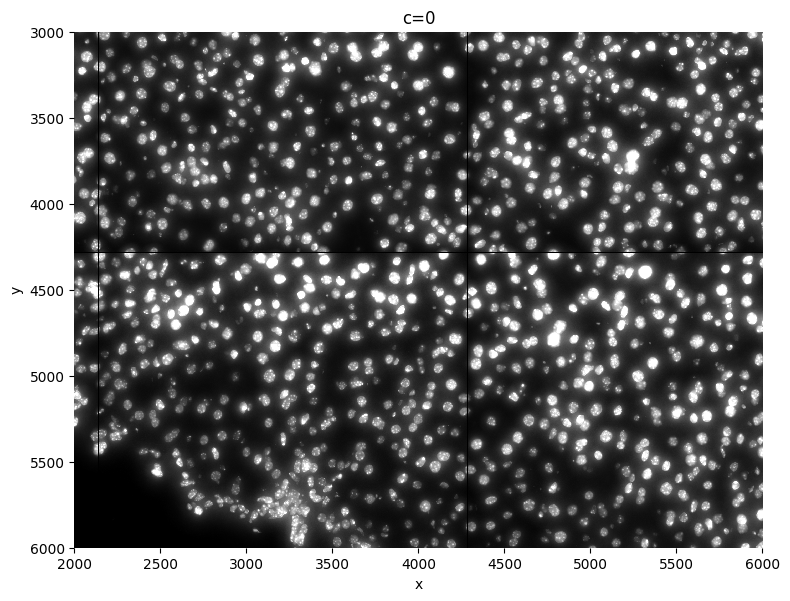

In [7]:
# Define crop coordinates [x0, x1, y0, y1] for visualization and quality inspection
crd = [2000, 6000, 3000, 6000]

# Visualize the raw image in the specified ROI
sp.pl.plot_image(sdata, img_layer="raw_image", crd=crd, figsize=(8, 8))

## 2. Image Preprocessing & Morphological Filtering

In spatial transcriptomics workflows, high-quality cell segmentation is critical. Standard fluorescence images often suffer from uneven illumination, noise, out-of-focus background fluorescence, or fabrication/tiling artifacts. Let's apply standard SPArrOW cleanup pipelines to resolve these issues.

### 2.1 Tiling Illumination Correction & Inpainting

On the **RESOLVE** platform, images are captured as sequential physical tiles. This tile-based imaging can introduce two major issues:
1. **Uneven Illumination (Vignetting):** The center of each physical tile is brighter than its edges due to excitation/detection profiles, leading to checkerboard or grid-like patterning.
2. **Inter-tile Grid Lines (Black Lines):** Microscopic gaps between stitched fields of view, which manifest as unexposed black margins.

While this intensity variation is purely morphological and doesn't skew spatial transcript counts, it severely degrades downstream deep learning nucleus and cell boundary segmentations (e.g., creating spurious boundaries or miscalculating cell shapes).

#### The SPArrOW Solution:
* **BaSiC Algorithm:** SPArrOW integrates the **BaSiC** illumination-correction algorithm to estimate and divide out the flatfield and darkfield patterns. The default frame size matches RESOLVE's physical camera aperture of $2144 \times 2144$ pixels.
* **Inpainting:** Gaps or black physical stitch lines are masked out and smoothly reconstructed using neighborhood bi-linear interpolation (inpainting) to form a seamless morphological reference layer.

Let's apply tiling correction to our input crop.

2025-12-17 12:10:38,660 - sparrow.image._manager - INFO - Writing results to layer 'tiling_correction'
version mismatch: detected: RasterFormatV02, requested: FormatV04
/home/arne/Repositories/napari-sparrow/.venv/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
version mismatch: detected: RasterFormatV02, requested: FormatV04


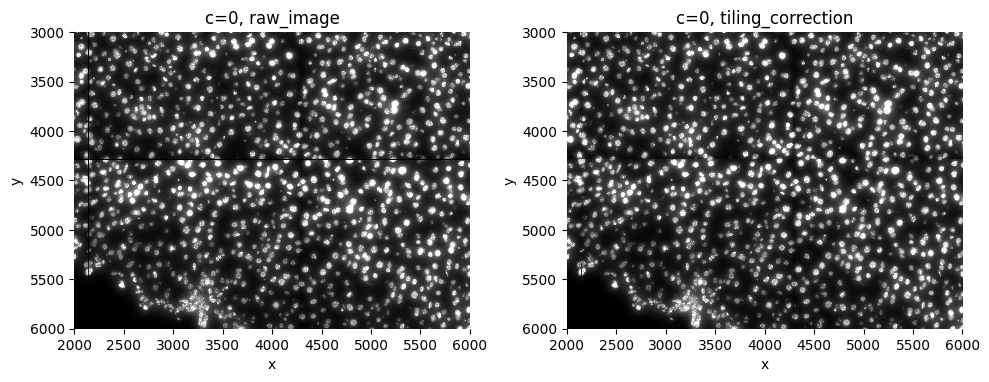

In [8]:
# Run BaSiC tiling/shading illumination correction and edge inpainting on our specified crop
sdata, flatfields = sp.im.tiling_correction(
    sdata=sdata,
    img_layer="raw_image",
    crd=crop_param,
    output_layer="tiling_correction",
    overwrite=True
)

# Plot a side-by-side comparison of the raw and corrected illumination patterns
sp.pl.tiling_correction(
    sdata,
    crd=crd,
    img_layer=["raw_image", "tiling_correction"],
    figsize=(10, 10)
)

### 2.2 Contrast Enhancement & Min-Max Filtering

After shading correction, additional morphological filtering can be applied to prepare the image specifically for segmentation:

1. **Min-Max Filtering:**
   * **Goal:** Subtract background haze/noise, remove autofluorescent cellular debris/speckles, and sharpen nuclear boundary definitions.
   * **Parameter Selection:** The search radius (`size_min_max_filter`) is critical. 
     * If the radius is chosen **too small** (smaller than nuclear diameter), the filter will erode the inside cores, resulting in "donut" artifacts with dark hollow centers.
     * If the radius is **too large**, background subtraction becomes ineffective.
     * **Recommended baseline:** $45\text{--}55$ pixels for nuclei in RESOLVE datasets; larger values for whole cells.

2. **Contrast Enhancement via CLAHE:**
   * **Goal:** Apply Contrast Limited Adaptive Histogram Equalization to locally amplify intensity differences in dimmer, under-exposed tissue regions without blowing out brighter structures.
   * **Parameter Selection:** Adjust `contrast_clip` (threshold limiting histogram redistribution):
     * **Medium/bright images:** $3.5$ is a reliable starting point.
     * **Weak/dark images:** Increase up to $10.0$ or higher.
     * Ensure the resulting image displays homogeneous contrast and even illumination across all cells.

*Note:* Standard practice in SPArrOW is to save each intermediate processing stage as a named layer within the `SpatialData` structure (e.g., `min_max_filtered` $\rightarrow$ `clahe`). This lets us audit intermediate results and chain modular filters.

Let's apply background subtraction and local contrast normalization.

2025-12-17 12:10:40,371 - sparrow.image._map - INFO - 'combine_z' is False, but not all 'z-slices' spefified in 'fn_kwargs'/'func' ({'size_min_max_filter': 45}/<function min_max_filtering.<locals>._apply_min_max_filter at 0x7fffec29d990>). Specifying z-slices ([0]).
2025-12-17 12:10:40,372 - sparrow.image._map - INFO - 'combine_c' is False, but not all channels spefified in 'fn_kwargs'/'func' ({0: {'size_min_max_filter': 45}}/{0: <function min_max_filtering.<locals>._apply_min_max_filter at 0x7fffec29d990>}). Specifying channels ([0]).
2025-12-17 12:10:40,389 - sparrow.image._manager - INFO - Writing results to layer 'min_max_filtered'
version mismatch: detected: RasterFormatV02, requested: FormatV04
/home/arne/Repositories/napari-sparrow/.venv/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
version mismatch: detected: RasterFormatV02, requested: FormatV04
ver

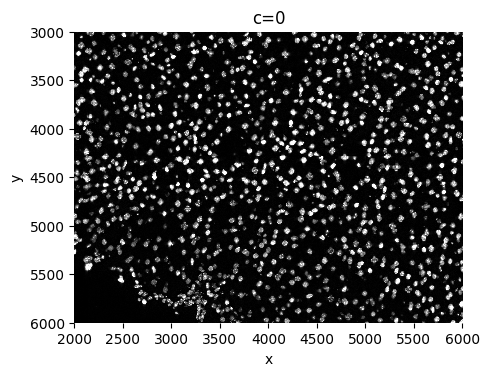

2025-12-17 12:10:42,553 - sparrow.image._map - INFO - 'combine_z' is False, but not all 'z-slices' spefified in 'fn_kwargs'/'func' ({'contrast_clip': 3.5}/<function enhance_contrast.<locals>._apply_clahe at 0x7ffe0b728ee0>). Specifying z-slices ([0]).
2025-12-17 12:10:42,554 - sparrow.image._map - INFO - 'combine_c' is False, but not all channels spefified in 'fn_kwargs'/'func' ({0: {'contrast_clip': 3.5}}/{0: <function enhance_contrast.<locals>._apply_clahe at 0x7ffe0b728ee0>}). Specifying channels ([0]).
2025-12-17 12:10:42,578 - sparrow.image._manager - INFO - Writing results to layer 'clahe'
version mismatch: detected: RasterFormatV02, requested: FormatV04
/home/arne/Repositories/napari-sparrow/.venv/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
version mismatch: detected: RasterFormatV02, requested: FormatV04
version mismatch: detected: RasterFormatV02,

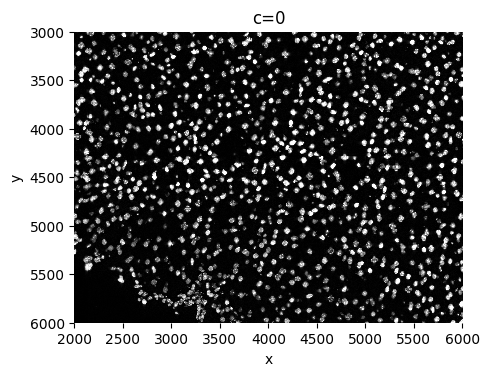

In [ ]:
# 1. Apply min-max background filtering to clean up debris and halos
sdata = sp.im.min_max_filtering(
    sdata=sdata,
    img_layer="tiling_correction",
    output_layer="min_max_filtered",
    size_min_max_filter=45,
    overwrite=True
)

# Visualize the background-corrected image
sp.pl.plot_image(sdata, img_layer="min_max_filtered", crd=crd, figsize=(5, 5))

# 2. Locally normalize contrast using CLAHE
sdata = sp.im.enhance_contrast(
    sdata=sdata,
    img_layer="min_max_filtered",
    output_layer="clahe",
    contrast_clip=3.5,
    chunks=20000,
    overwrite=True
)

# Visualize contrast-normalized image
sp.pl.plot_image(sdata, img_layer="clahe", crd=crd, figsize=(5, 5))

## 3. High-Throughput Nuclear Segmentation

For the segmentation, we here show an example on how to use Cellpose, a deep learning network based on a UNET architecture with the ability to both segment nuclei and whole cells.

### Parameter Optimization in Cellpose

Tuning the algorithm parameters ensures clean, boundary definitions. The most critical hyperparameters include:

| Parameter | Standard Nuclear Default | Purpose & Tuning Strategy |
| :--- | :--- | :--- |
| **`diameter`** | `50` | Expected diameter of a nucleus in pixels (RESOLVE resolution: $0.138~\mu\text{m/pixel}$, so $7~\mu\text{m} \approx 50$ pixels). Setting this to `None` triggers auto-estimation, which is significantly slower and less reliable. |
| **`flow_threshold`** | `0.9` | Cellpose flow error threshold. Higher values (up to $1.0$) permit irregular or non-circular nucleolar shapes. Decrease if spam/artifacts are segmented. |
| **`cellprob_threshold`** | `-4.0` | Mask detection cutoff (usually set between $-6.0$ and $0.0$). Lower thresholds accept more cell cores, while higher values are more conservative. |
| **`min_size`** | `80` | Minimum physical pixel size cutoff. Tiny, noisy background artifacts are automatically pruned. |
| **`pretrained_model`** | `"nuclei"` | Pre-trained model family. Use `"nuclei"` for DAPI/nuclear stains, and `"cyto"`/`"cyto3"` for cytoplasmic profiles. |

Let's initialize our Dask cluster to run parallelized Cellpose across chunked regions.

Using device: cpu.
http://127.0.0.1:8787/status


/home/arne/Repositories/napari-sparrow/.venv/lib/python3.10/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/home/arne/Repositories/napari-sparrow/.venv/lib/python3.10/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
the value of the environment variable BASIC_DCT_BACKEND is not in ["JAX","SCIPY"]
the value of the environment variable BASIC_DCT_BACKEND is not in ["JAX","SCIPY"]
2025-12-17 1

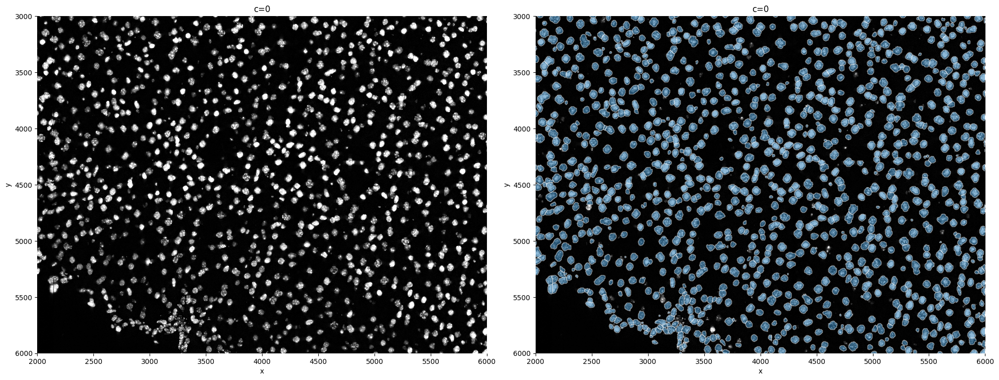

In [ ]:
# Assess system hardware acceleration capabilities
cellpose_version = version.parse(cellpose.version)

if torch.backends.mps.is_available() and cellpose_version >= version.parse("4.0"):
    device = "mps"
    chunks = 6432  # Larger chunk size optimized for GPU processing
elif torch.cuda.is_available():
    device = "cuda"
    chunks = 6432  # Larger chunk size optimized for GPU processing
else:
    device = "cpu"
    chunks = 2048  # Smaller chunk size optimized for distributed CPU cores

print(f"Hardware initialization completed. Selected compute unit: {device.upper()}")

# Spin up a localized Dask worker pool for distributed tiled execution
# On CPU we distribute chunks to multiple threads; on GPU we run sequentially in a single worker.
cluster = LocalCluster(
    n_workers=8 if device == "cpu" else 1,
    threads_per_worker=1,
    memory_limit="32GB",
)
client = Client(cluster)
print(f"Distributed scheduling dashboard active at: {client.dashboard_link}")

# Run segmentation over intermediate 'clahe' contrast layer
sdata = sp.im.segment(
    sdata=sdata,
    img_layer="clahe",
    output_labels_layer="segmentation_mask",
    output_shapes_layer="segmentation_mask_boundaries",
    crd=crop_param,
    device=device,
    min_size=80,
    flow_threshold=0.9,
    diameter=50,
    cellprob_threshold=-4,
    pretrained_model="nuclei",
    chunks=chunks,
    depth=(2 * 50, 2 * 50),  # Depth overlap to prevent boundary artifacts between chunks
    overwrite=True,
)

# Shutdown distributed pool to release RAM/GPU resources
client.close()
cluster.close()

# Quick plot of segmentation masks overlaid on our reference channels
sp.pl.segment(
    sdata=sdata,
    crd=crd,
    img_layer="clahe",
    shapes_layer="segmentation_mask_boundaries"
)

### 3.1 Optional Cell Boundary Expansion (generally not recommended)

In nuclear-only segmentation (e.g., when cytoplasmic membrane stains are unavailable), cytoplasm-localized transcripts fall outside the segmented boundaries and are excluded. 

To recover these transcripts, SPArrOW provides an **label expansion** mechanism:
* Boundaries are computationally grown outwards by a user-specified radius threshold (e.g., $10$ pixels) using Euclidean distance propagation.
* Expansion stops when encountering neighbors, preventing overlapping or merging of adjacent masks.

*Note on application:* While expansion captures cytoplasm transcripts, it increases the risk of contamination (misassigning bordering transcripts from neighbors) in dense tissues. This choice should be made depending on cell packing density.

/home/arne/Repositories/napari-sparrow/.venv/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
2025-12-17 12:13:30,110 - sparrow.image.segmentation._map - INFO - Linking labels across chunks.
2025-12-17 12:13:30,136 - sparrow.image._manager - INFO - Writing results to layer 'segmentation_mask_expanded'
/home/arne/Repositories/napari-sparrow/.venv/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/home/arne/Repositories/napari-sparrow/.venv/lib/python3.10/site-packages/rasterio/features.py:129: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  yield from _shapes(source, mask, connectivity, transform)
/home/arne/Repositories/napari-sparrow/.venv/lib/python3.10/site-packages/rasterio

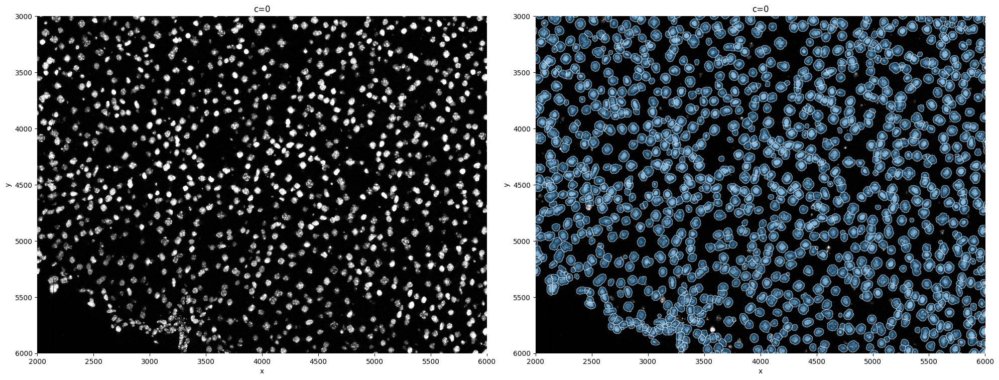

In [ ]:
expand_masks = True

if expand_masks:
    # Grow segmentation masks by 10 pixels to approximately cover cytoplasmic regions
    sdata = sp.im.expand_labels_layer(
        sdata,
        labels_layer="segmentation_mask",
        distance=10,
        output_labels_layer="segmentation_mask_expanded",
        output_shapes_layer="segmentation_mask_expanded_boundaries",
        overwrite=True,
    )
    
    # Render the newly expanded cellular territories
    sp.pl.segment(
        sdata=sdata,
        crd=crd,
        img_layer="clahe",
        shapes_layer="segmentation_mask_expanded_boundaries"
    )

## 4. Transcript Allocation & Count Matrix Generation

With both morphological labels (segmentation masks) and coordinate-based transcripts registered in the same spatial coordinate system, we can assign (allocate) each transcript to its host cell to build our single-cell cell-by-gene expression profile.

### 4.1 Loading & Mapping Transcripts

This step is executed in two stages:
1. **Load Raw Coordinates:** In RESOLVE data, coordinates are loaded using the specialized `read_resolve_transcripts` function, which maps spatial coordinate files on disk to our high-resolution SpatialData Zarr structures.
2. **Spatial Assign-and-Bin (Allocation):** We overlap 3D transcript coordinates with our segmentation masks. Transcripts falling inside any labeled nucleus/cell boundary are assigned that nucleus' integer ID. Finally, sums of gene-wise assigned transcripts are compiled into an `AnnData` object, which is appended to our `SpatialData` container as `sdata.tables` (e.g., `sdata.tables["table_transcriptomics"]`).

In [12]:
# 1. Parse and ingest raw RESOLVE coordinates 
sdata = sp.io.read_resolve_transcripts(
    sdata,
    output_layer="transcripts",
    path_count_matrix=path_coordinates,
    overwrite=True
)

# 2. Perform point-in-polygon assignment (allocation) to construct the AnnData count matrix
sdata = sp.tb.allocate(
    sdata=sdata,
    labels_layer="segmentation_mask",
    points_layer="transcripts",
    output_layer="table_transcriptomics",
    overwrite=True,
)

2025-12-17 12:13:34,188 - sparrow.io._transcripts - INFO - No transform matrix given, will use identity matrix.
2025-12-17 12:13:38,578 - sparrow.table._allocation - INFO - Calculating cell counts.
2025-12-17 12:13:39,371 - sparrow.shape._manager - INFO - Filtering 16 cells from shapes layer 'segmentation_mask_boundaries'. Adding new shapes layer 'filtered_segmentation_segmentation_mask_boundaries' containing these filtered out polygons.
2025-12-17 12:13:39,574 - sparrow.utils._io - WARNING - layer with name 'segmentation_mask_boundaries' already exists. Overwriting...
2025-12-17 12:13:39,729 - sparrow.shape._manager - INFO - Filtering 16 cells from shapes layer 'segmentation_mask_expanded_boundaries'. Adding new shapes layer 'filtered_segmentation_segmentation_mask_expanded_boundaries' containing these filtered out polygons.
2025-12-17 12:13:39,951 - sparrow.utils._io - WARNING - layer with name 'segmentation_mask_expanded_boundaries' already exists. Overwriting...


### 4.2 Single-Cell Quality Control & Spatial Auditing

After building the cell-by-gene expression records, we can audit the results. We verify alignment by taking a random segmented tissue label and a specific marker gene (e.g., $Ghr$) to check:
1. The numeric expression level of the marker inside our selected cell.
2. The physical distribution layout of transcripts on top of the nuclear reference boundaries.

In [13]:
# Extract a specific segmented nucleus from the computed count table
matching_indexes = [
    idx for idx in sdata.tables["table_transcriptomics"].to_df().index 
    if idx.startswith("34_segmentation_mask")
]
random_cell = matching_indexes[0]
random_gene = "Ghr"

# Query the transcriptomics AnnData object for our target cell and gene
sdata.tables["table_transcriptomics"][random_cell, random_gene].to_df()

,Ghr
cells,
34_segmentation_mask_3671d7c6,4


plot transcripts matrix for cell 34_segmentation_mask_3671d7c6 and gene Ghr


2025-12-17 12:13:40,454 - sparrow.plot._sanity - INFO - Plotting 35 transcripts.
2025-12-17 12:13:40,456 - sparrow.plot._sanity - INFO - Selecting boundaries
2025-12-17 12:13:40,462 - sparrow.plot._sanity - INFO - Plotting boundaries
2025-12-17 12:13:40,502 - sparrow.plot._sanity - INFO - End plotting boundaries


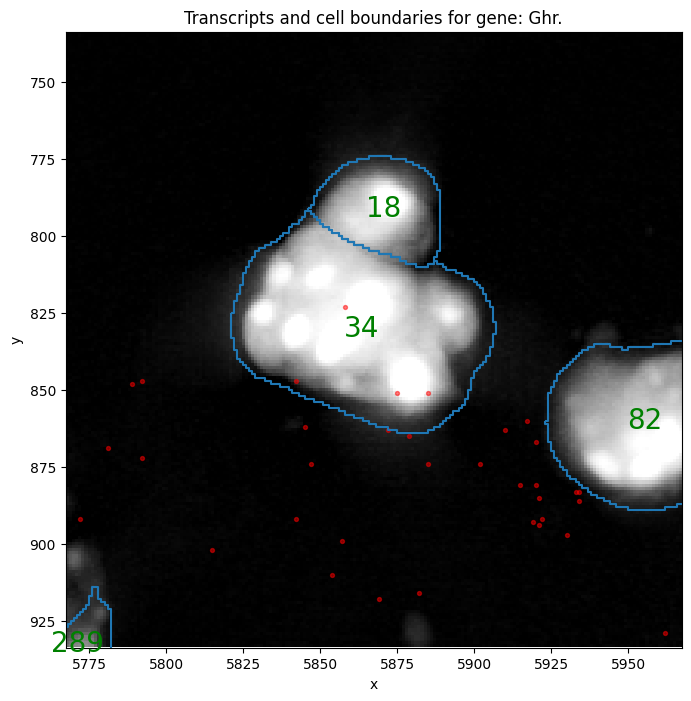

In [14]:
diameter = 50

if random_cell is not None and random_gene is not None:
    # Get the spatial center of our target cell
    cell_center = sdata.tables["table_transcriptomics"].obsm["spatial"][
        sdata.tables["table_transcriptomics"].to_df().index.get_loc(str(random_cell))
    ]
    
    # Establish a local bounding box around the target cell's coordinates
    crd_sanity = [
        cell_center[0] - (diameter + 50),
        cell_center[0] + (diameter + 50),
        cell_center[1] - (diameter + 50),
        cell_center[1] + (diameter + 50),
    ]

    print(f"Auditing transcripts layout for cell: {random_cell} and gene: {random_gene}")

    # Generate a tight validation overlay plot
    sp.pl.sanity(
        sdata=sdata,
        img_layer="clahe",
        points_layer="transcripts",
        shapes_layer="segmentation_mask_boundaries",
        crd=crd_sanity,
        plot_cell_number=True,
        gene=random_gene,
        figsize=(8, 8),
    )

### 4.3 Pruning Empty Segmentation Masks (Zero-Count Pruning)

During point-in-polygon mapping, some segmented nuclei will end up containing **zero transcripts**. This typically happens due to:
* **Autofluorescent debris/artifacts** getting misclassified as real cells by Cellpose.
* **Biological necrosis** where a physical nucleus is present but the cellular cytoplasm possesses no localized mRNA templates.

Rather than cluttering downstream tables with empty entries, SPArrOW automatically filters empty segmented objects from your primary `AnnData` table. These empty shapes are preserved and stored in a fallback shapes layer (e.g., `filtered_segmentation_segmentation_mask_boundaries`).

By calling `sp.pl.plot_shapes` with the `shapes_layer_filtered` parameter, you can render these empty cellular entities (highlighted with red borders) on the image. This sanity check allows you to verify that they are indeed empty regions or debris, as opposed to segmentation misses.

In [15]:
sdata

SpatialData object, with associated Zarr store: /tmp/nix-shell.wcNPOY/sdata_bb7759bc-5cdf-428e-87bc-7a188a95b5f3.zarr
├── Images
│     ├── 'clahe': DataArray[cyx] (1, 6432, 6432)
│     ├── 'min_max_filtered': DataArray[cyx] (1, 6432, 6432)
│     ├── 'raw_image': DataArray[cyx] (1, 12864, 10720)
│     └── 'tiling_correction': DataArray[cyx] (1, 6432, 6432)
├── Labels
│     ├── 'segmentation_mask': DataArray[yx] (6432, 6432)
│     └── 'segmentation_mask_expanded': DataArray[yx] (6432, 6432)
├── Points
│     └── 'transcripts': DataFrame with shape: (<Delayed>, 3) (2D points)
├── Shapes
│     ├── 'filtered_segmentation_segmentation_mask_boundaries': GeoDataFrame shape: (16, 1) (2D shapes)
│     ├── 'filtered_segmentation_segmentation_mask_expanded_boundaries': GeoDataFrame shape: (16, 1) (2D shapes)
│     ├── 'segmentation_mask_boundaries': GeoDataFrame shape: (3360, 1) (2D shapes)
│     └── 'segmentation_mask_expanded_boundaries': GeoDataFrame shape: (3360, 1) (2D shapes)
└── Tables
     

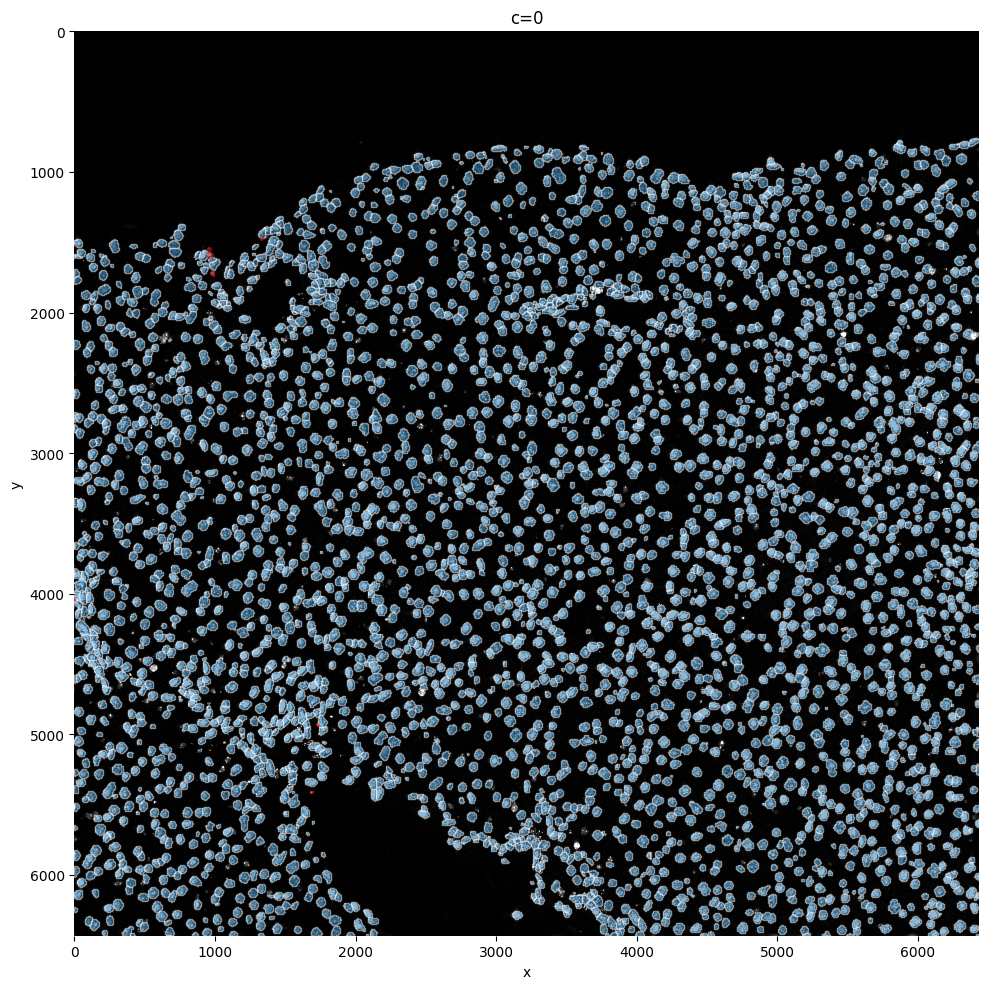

In [16]:
# Plot the segmentation masks with zero-count empty shapes highlighted in red outlines
sp.pl.plot_shapes(
    sdata,
    img_layer="clahe",
    shapes_layer="segmentation_mask_boundaries",
    shapes_layer_filtered="filtered_segmentation_segmentation_mask_boundaries",
)

### 4.4 Transcript Quality & Capture Density

To evaluate transcriptomics capturing efficiency and spatial homogeneity, we compute and plot local transcript density. This diagnostic step helps detect:
1. **Physical capture failure:** Regions where RNA binding or probe hybridization was locally unsuccessful (e.g., tissue tears, air bubbles, staining gradients).
2. **Biological variation:** True biological features (e.g., dense cell zones versus sparse structures).

2025-12-17 12:13:46,534 - sparrow.image._manager - INFO - Writing results to layer 'transcript_density'
version mismatch: detected: RasterFormatV02, requested: FormatV04
version mismatch: detected: RasterFormatV02, requested: FormatV04
version mismatch: detected: RasterFormatV02, requested: FormatV04
version mismatch: detected: RasterFormatV02, requested: FormatV04
version mismatch: detected: RasterFormatV02, requested: FormatV04


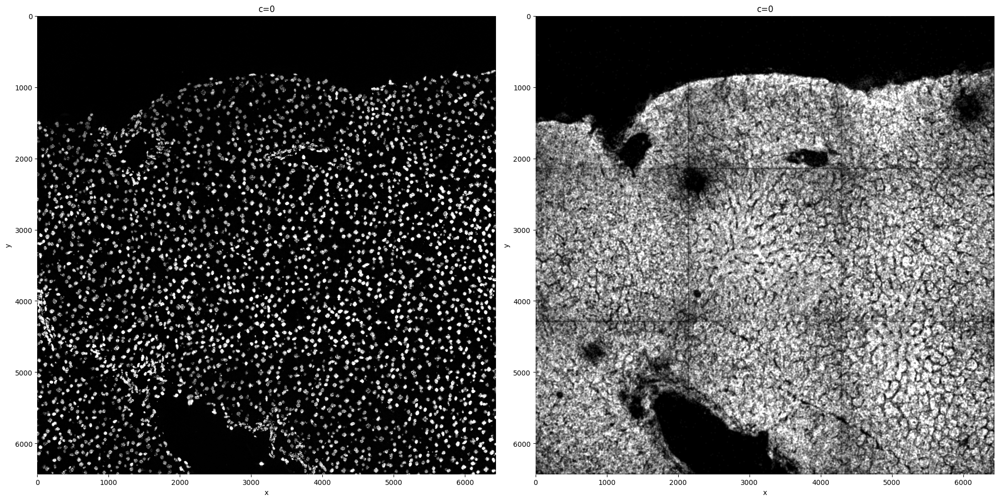

In [17]:
# Calculate local transcript density over the entire crop area
sdata = sp.im.transcript_density(
    sdata,
    img_layer="clahe",
    points_layer="transcripts",
    output_layer="transcript_density",
    overwrite=True,
)

# Plot the density map next to the morphology image
sp.pl.transcript_density(sdata, img_layer=["clahe", "transcript_density"])

### 4.5 Analyzing Unassigned (Left-Out) Transcripts

Because we do not segment the entire surface of the tissue (especially when conducting **nuclear-only** segmentation), a substantial portion of transcripts residing in cytoplasmic or extracellular regions will remain unassigned.

#### How to Interpret Left-Out Genes
Evaluating which genes have a low assignment ratio is an important quality check:
* **Expected Trend:** Highly abundant genes normally show a steady down-trend in assignment ratio because they spill into extracellular spaces.
* **Cell-Type Bias:** If a set of markers representing a single cell type are consistently left out, it could mean:
  * That specific cell type has been completely missed or misclassified during segmentation.
  * The cell type has an exceptionally large cytoplasm-to-nucleus ratio (meaning nuclear-only segmentation fails to capture its transcript pool).

You may need to apply native whole cell segmentation (or cytoplasmic expansion as seen in step 3.1) to recover these coordinates.

SPArrOW allows you to display a diagnostics plot of gene abundances vs. proportion kept, and outputs a table listing the most frequently left-out genes.

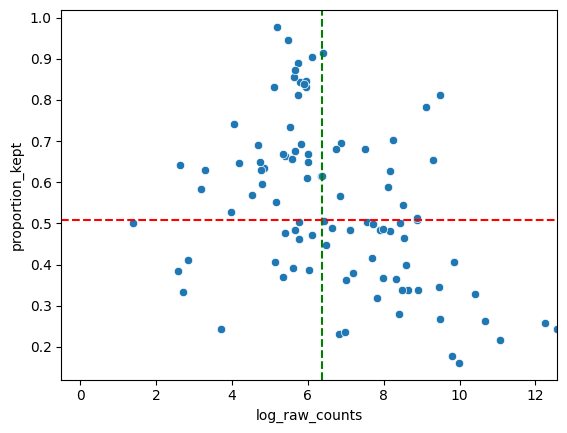

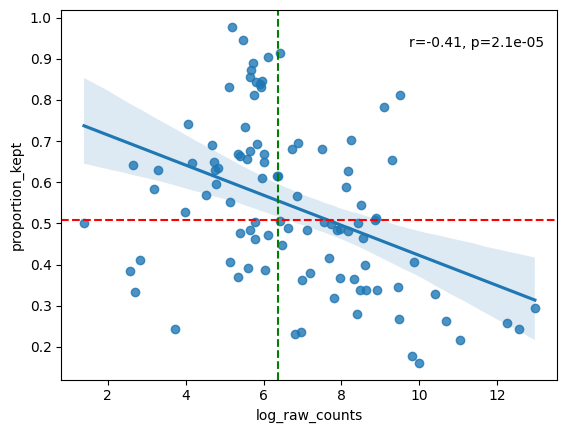

2025-12-17 12:13:53,963 - sparrow.plot._transcripts - INFO - The ten genes with the highest proportion of transcripts filtered out in the region of interest ([x_min,x_max,y_min,y_max]=(0, 6432, 0, 6432)):
          proportion_kept  raw_counts
Gls2             0.161150       21992
Glul             0.176623       18197
Ghr              0.216355       63345
Atp6v0d2         0.231023         909
Des              0.235183        1063
Cyp2e1           0.242622      289182
Folr2            0.243902          41
Fn1              0.257046      210546
Hal              0.261997       43428
Slc40a1          0.267609       13161


In [18]:
filtered = sp.pl.analyse_genes_left_out(
    sdata,
    labels_layer="segmentation_mask",
    table_layer="table_transcriptomics",
    points_layer="transcripts",
)

## 5. Single-Cell Quality Control, Filtering, & Normalization

Once we have compiled and verified our spatial single-cell count matrix, we perform standard single-cell pre-processing steps as we would in scRNA-seq pipelines, adjusted for spatial properties.

### 5.1 Cellular Filtering & Normalization Strategies

Our raw cell-by-gene count table is preprocessed using the following workflow:

1. **Calculate QC Metrics:** Compute total counts per cell, genes detected per cell.
2. **Quality Control Pruning:**
   * **Low-count cell pruning:** Exclude cells with fewer than $10$ transcripts (`min_counts=10`).
   * **Low-occurrence gene pruning:** Exclude genes that appear in fewer than $5$ cells (`min_cells=5`).
   * *Spatial Syncing:* Filtered-out cell boundaries are removed from our main tables, keeping alignment clean. They are archived as a dedicated fallback shapes layer.
3. **Data Normalization:**
   * **Targeted/Small gene panels (< 500 genes (e.g. Xenium)):** Standard count size normalization can distort biological signals since total captured UMIs might depend strongly on physical nuclear/cell volume. We recommend **Size Normalization** (`size_norm=True`), which normalizes transcript count ratios directly by the cell's physical mask volume.
   * **Transcriptome-wide panels (e.g., Visium HD and CosMx):** Total cellular library size is robust. We recommend standard **library-size normalization** (`size_norm=False`), which utilizes `scanpy.pp.normalize_total` behind the scenes.

We will also check if cell physical size correlates with total transcript counts. A massive nuclear mask with very few counts is highly likely a segmentation merging error.

Let's compute QC metrics, filter poor-quality cells, and normalize expression.

In [19]:
sdata

SpatialData object, with associated Zarr store: /tmp/nix-shell.wcNPOY/sdata_bb7759bc-5cdf-428e-87bc-7a188a95b5f3.zarr
├── Images
│     ├── 'clahe': DataArray[cyx] (1, 6432, 6432)
│     ├── 'min_max_filtered': DataArray[cyx] (1, 6432, 6432)
│     ├── 'raw_image': DataArray[cyx] (1, 12864, 10720)
│     ├── 'tiling_correction': DataArray[cyx] (1, 6432, 6432)
│     └── 'transcript_density': DataArray[cyx] (1, 6432, 6432)
├── Labels
│     ├── 'segmentation_mask': DataArray[yx] (6432, 6432)
│     └── 'segmentation_mask_expanded': DataArray[yx] (6432, 6432)
├── Points
│     └── 'transcripts': DataFrame with shape: (<Delayed>, 3) (2D points)
├── Shapes
│     ├── 'filtered_segmentation_segmentation_mask_boundaries': GeoDataFrame shape: (16, 1) (2D shapes)
│     ├── 'filtered_segmentation_segmentation_mask_expanded_boundaries': GeoDataFrame shape: (16, 1) (2D shapes)
│     ├── 'segmentation_mask_boundaries': GeoDataFrame shape: (3360, 1) (2D shapes)
│     └── 'segmentation_mask_expanded_boundari

In [ ]:
sdata = sp.tb.preprocess_transcriptomics(
    sdata,
    labels_layer="segmentation_mask",
    table_layer="table_transcriptomics",
    output_layer="table_transcriptomics_preprocessed",  # Save results to a separate downstream table slot
    min_counts=10,
    min_cells=5,
    size_norm=True,  # Recommended: True for targeted panels; False for transcriptome-wide panels
    n_comps=50,
    overwrite=True,
)

2025-12-17 12:14:05,234 - sparrow.table._preprocess - INFO - Calculating cell size from provided labels_layer 'segmentation_mask'
2025-12-17 12:14:07,667 - sparrow.shape._manager - INFO - Filtering 107 cells from shapes layer 'segmentation_mask_boundaries'. Adding new shapes layer 'filtered_low_counts_segmentation_mask_boundaries' containing these filtered out polygons.
2025-12-17 12:14:07,944 - sparrow.utils._io - WARNING - layer with name 'segmentation_mask_boundaries' already exists. Overwriting...
2025-12-17 12:14:08,154 - sparrow.shape._manager - INFO - Filtering 107 cells from shapes layer 'segmentation_mask_expanded_boundaries'. Adding new shapes layer 'filtered_low_counts_segmentation_mask_expanded_boundaries' containing these filtered out polygons.
2025-12-17 12:14:08,461 - sparrow.utils._io - WARNING - layer with name 'segmentation_mask_expanded_boundaries' already exists. Overwriting...


The raw, un-normalized counts are archived and accessible in `sdata.tables['table_transcriptomics_preprocessed'].layers['raw_counts']`. The computed physical size-normalized expression matrices are situated directly in `.raw`.

In [21]:
sdata.tables["table_transcriptomics_preprocessed"].raw.to_adata().to_df()

,Acta2,Adamtsl2,Adgre1,Adgrg6,Atp6v0d2,Axl,C5ar1,Ccr2,Ccr7,Cd14,...,Svep1,Timd4,Tmem119,Trem2,Vsig4,Vwf,Wnt2,Wnt9b,Wt1,Xcr1
cells,,,,,,,,,,,,,,,,,,,,,
17_segmentation_mask_3671d7c6,0.0,0.027087,0.000000,0.0,0.00000,0.027087,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.053460,0.0
18_segmentation_mask_3671d7c6,0.0,0.000000,0.438225,0.0,0.00000,0.168322,0.087699,0.0,0.0,0.0,...,0.000000,0.0,0.242928,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
32_segmentation_mask_3671d7c6,0.0,0.000000,0.000000,0.0,0.00000,0.039360,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
33_segmentation_mask_3671d7c6,0.0,0.333588,0.000000,0.0,0.00000,0.035364,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.134521,0.0,0.0,0.0,0.0,0.0,0.134521,0.0
34_segmentation_mask_3671d7c6,0.0,0.158128,0.024179,0.0,0.00000,0.115442,0.000000,0.0,0.0,0.0,...,0.070851,0.0,0.047787,0.0,0.0,0.0,0.0,0.0,0.070851,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7534_segmentation_mask_3671d7c6,0.0,0.000000,0.000000,0.0,0.00000,0.000000,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
7548_segmentation_mask_3671d7c6,0.0,0.000000,0.000000,0.0,0.00000,0.000000,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
7560_segmentation_mask_3671d7c6,0.0,0.000000,0.000000,0.0,0.00000,0.000000,0.000000,0.0,0.0,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


In [22]:
sdata.tables["table_transcriptomics_preprocessed"].layers["raw_counts"]

<3253x98 sparse matrix of type '<class 'numpy.uint32'>'
	with 44138 stored elements in Compressed Sparse Row format>

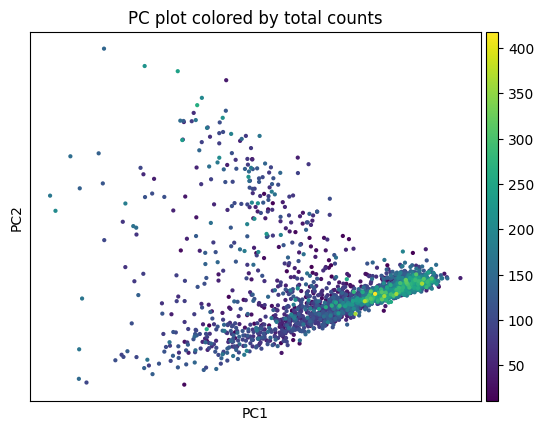

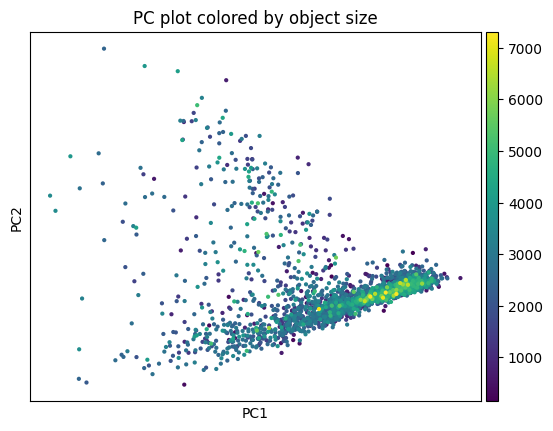

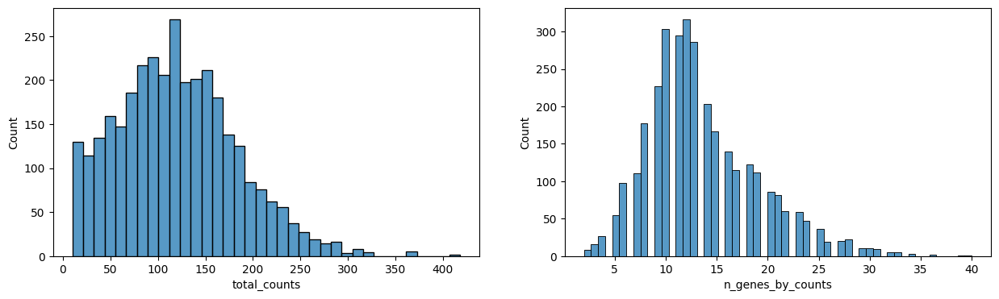

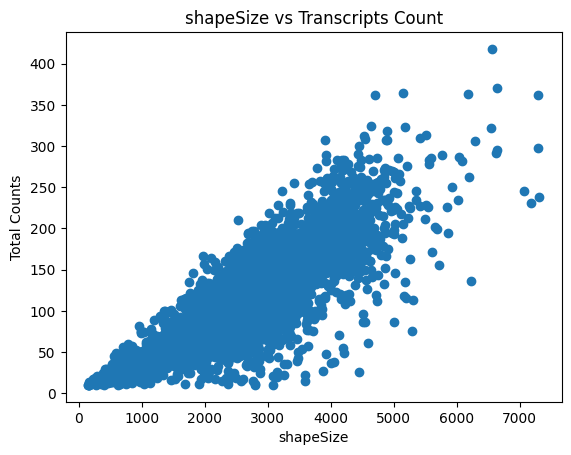

In [ ]:
# Plot QC distributions
sp.pl.preprocess_transcriptomics(
    sdata,
    table_layer="table_transcriptomics_preprocessed",
)

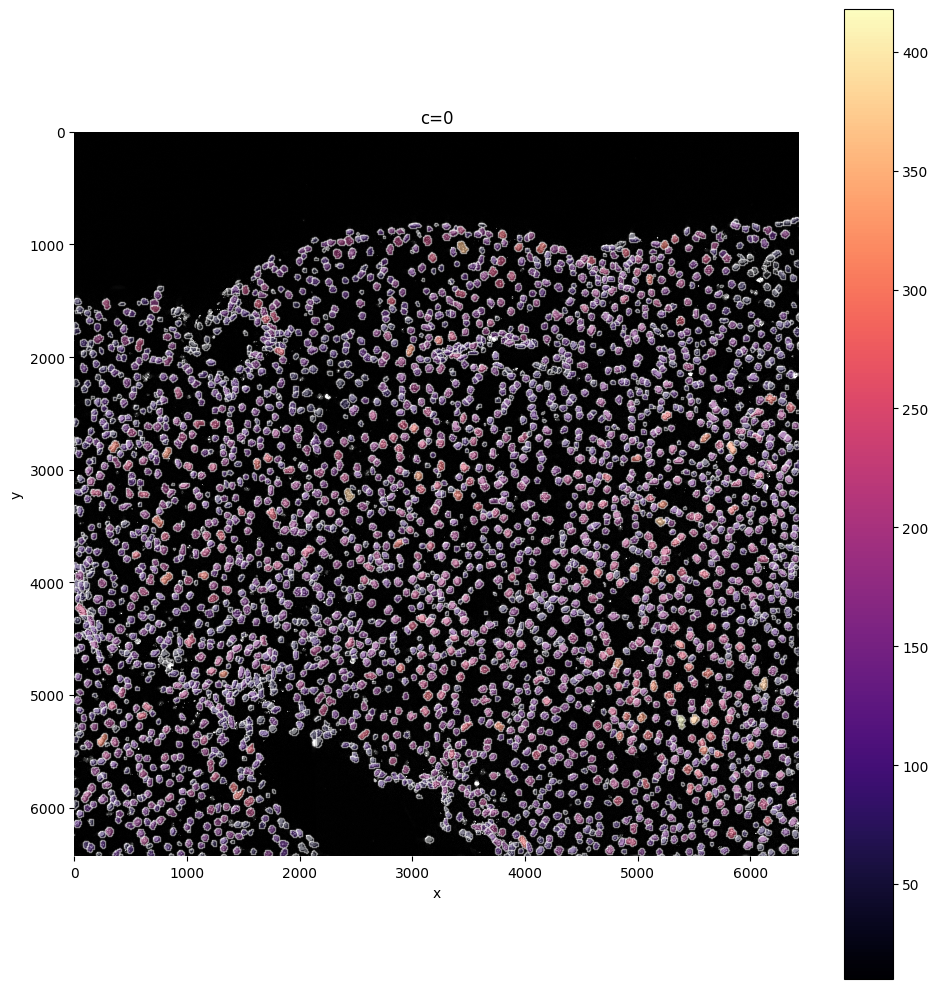

In [24]:
# Visualize total transcript counts per cell overlaid on coordinate shape definitions
sp.pl.plot_shapes(
    sdata,
    img_layer="clahe",
    table_layer="table_transcriptomics_preprocessed",
    column="total_counts",
    shapes_layer="segmentation_mask_boundaries",
)

### 5.2 Size-Based Outlier Filtering (Nuclear Mask Area Filtering)

To ensure high-quality biological representations, we further filter segmented masks based on their physical surface area metrics:
* **Over-segmented/Tiny items (`min_size`):** Exclude segmentations too small to represent a real cell nucleus (typically representing noisy fluorescence debris).
* **Under-segmented/Giant items (`max_size`):** Exclude segmentations too large to represent single cells (typically indicating cell clusters or segmentation mergers that weren't splitting properly).

By utilizing the standard `sp.tb.filter_on_size` function, boundaries outside of specified limits ($500\text{--}100,000$ pixels) are pruned and isolated into our fallback layers.

2025-12-17 12:14:13,450 - sparrow.shape._manager - INFO - Filtering 74 cells from shapes layer 'segmentation_mask_boundaries'. Adding new shapes layer 'filtered_size_segmentation_mask_boundaries' containing these filtered out polygons.
2025-12-17 12:14:13,799 - sparrow.utils._io - WARNING - layer with name 'segmentation_mask_boundaries' already exists. Overwriting...
2025-12-17 12:14:14,063 - sparrow.shape._manager - INFO - Filtering 74 cells from shapes layer 'segmentation_mask_expanded_boundaries'. Adding new shapes layer 'filtered_size_segmentation_mask_expanded_boundaries' containing these filtered out polygons.
2025-12-17 12:14:14,429 - sparrow.utils._io - WARNING - layer with name 'segmentation_mask_expanded_boundaries' already exists. Overwriting...
2025-12-17 12:14:14,687 - sparrow.table._table - INFO - 74 cells were filtered out based on size.


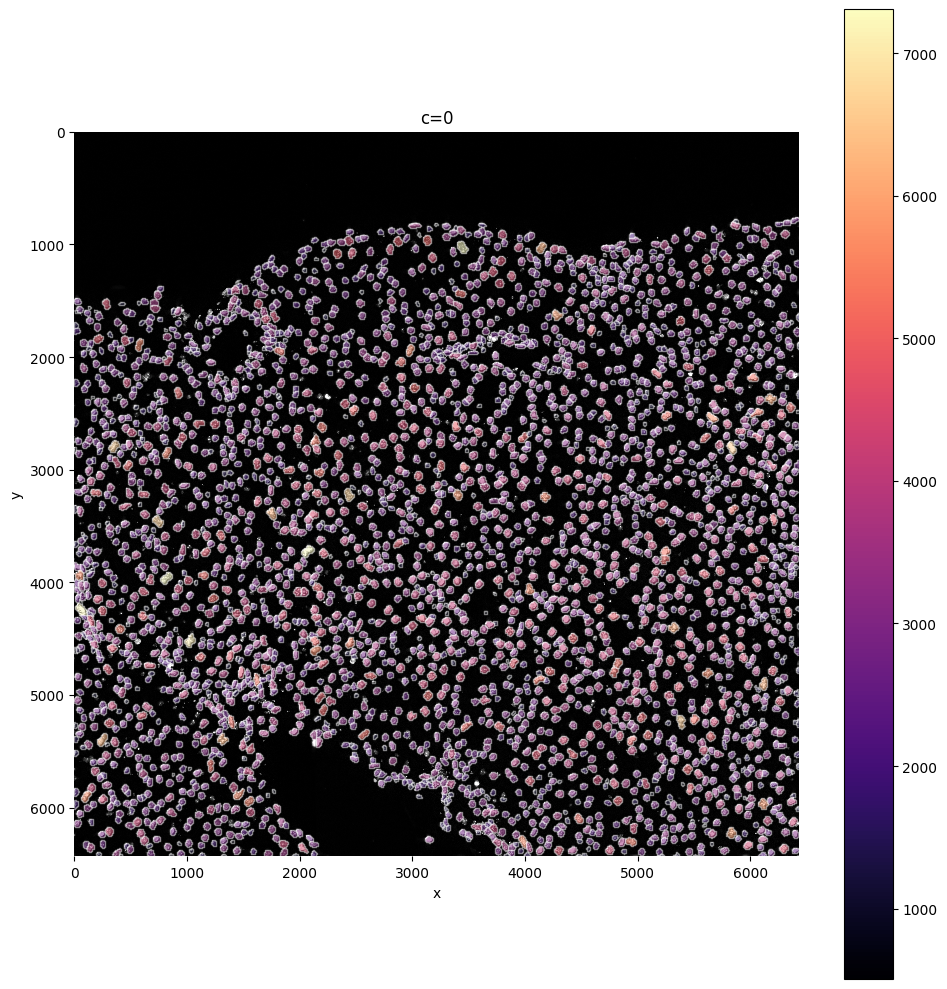

In [25]:
# Filter out cells with physical nuclear areas smaller than 500 pixels or larger than 100,000 pixels
sdata = sp.tb.filter_on_size(
    sdata,
    labels_layer="segmentation_mask",
    table_layer="table_transcriptomics_preprocessed",
    output_layer="table_transcriptomics_filter",
    min_size=500,
    max_size=100000,
    overwrite=True,
)

# Plot physical shapes colored by area to verify outlier exclusion
sp.pl.plot_shapes(
    sdata,
    img_layer="clahe",
    table_layer="table_transcriptomics_filter",
    column="shapeSize",
    shapes_layer="segmentation_mask_boundaries",
)

In [26]:
sdata

SpatialData object, with associated Zarr store: /tmp/nix-shell.wcNPOY/sdata_bb7759bc-5cdf-428e-87bc-7a188a95b5f3.zarr
├── Images
│     ├── 'clahe': DataArray[cyx] (1, 6432, 6432)
│     ├── 'min_max_filtered': DataArray[cyx] (1, 6432, 6432)
│     ├── 'raw_image': DataArray[cyx] (1, 12864, 10720)
│     ├── 'tiling_correction': DataArray[cyx] (1, 6432, 6432)
│     └── 'transcript_density': DataArray[cyx] (1, 6432, 6432)
├── Labels
│     ├── 'segmentation_mask': DataArray[yx] (6432, 6432)
│     └── 'segmentation_mask_expanded': DataArray[yx] (6432, 6432)
├── Points
│     └── 'transcripts': DataFrame with shape: (<Delayed>, 3) (2D points)
├── Shapes
│     ├── 'filtered_low_counts_segmentation_mask_boundaries': GeoDataFrame shape: (107, 1) (2D shapes)
│     ├── 'filtered_low_counts_segmentation_mask_expanded_boundaries': GeoDataFrame shape: (107, 1) (2D shapes)
│     ├── 'filtered_segmentation_segmentation_mask_boundaries': GeoDataFrame shape: (16, 1) (2D shapes)
│     ├── 'filtered_segmenta

### 5.3 Unsupervised Leiden Clustering

The next stage of downstream analysis partitions cells into distinct transcriptionally-homogeneous clusters using standard single-cell workflows. Under the hood, the following steps are performed:
* **Dimensionality Reduction:** Select the quantity of Principal Components (`n_pcs`) to capture most biological variance. A baseline of $15\text{--}20$ PCs is ideal.
* **Neighborhood Search & Leiden Partitioning:**
  * **Number of Neighbors (`n_neighbors`):** Adjusts local vs global topology structure (in general values should be in the range $2$ to $100$). The size of local neighborhood (in terms of number of neighboring data points) used for manifold approximation. Larger values result in more global views of the manifold, while smaller values result in more local data being preserved.
  * **Leiden Clustering:** Partition the cell-to-cell KNN-graph into clusters under a given resolution (default = `resolution=0.8`). The parameter controls the coarseness of the clustering as higher values lead to more clusters.

This operation returns standard UMAP embeddings and calculates ranked marker genes per cluster to assist in cell type taxonomy mapping.

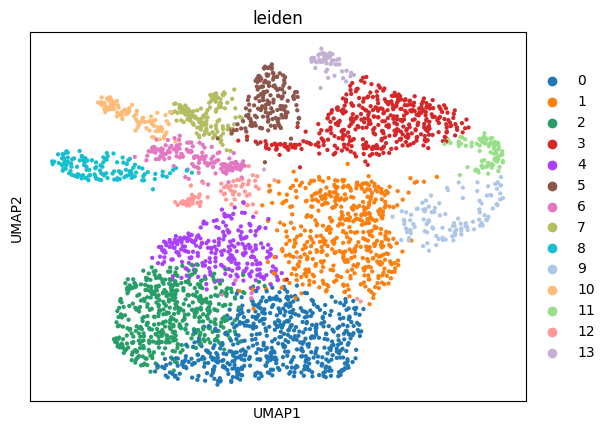

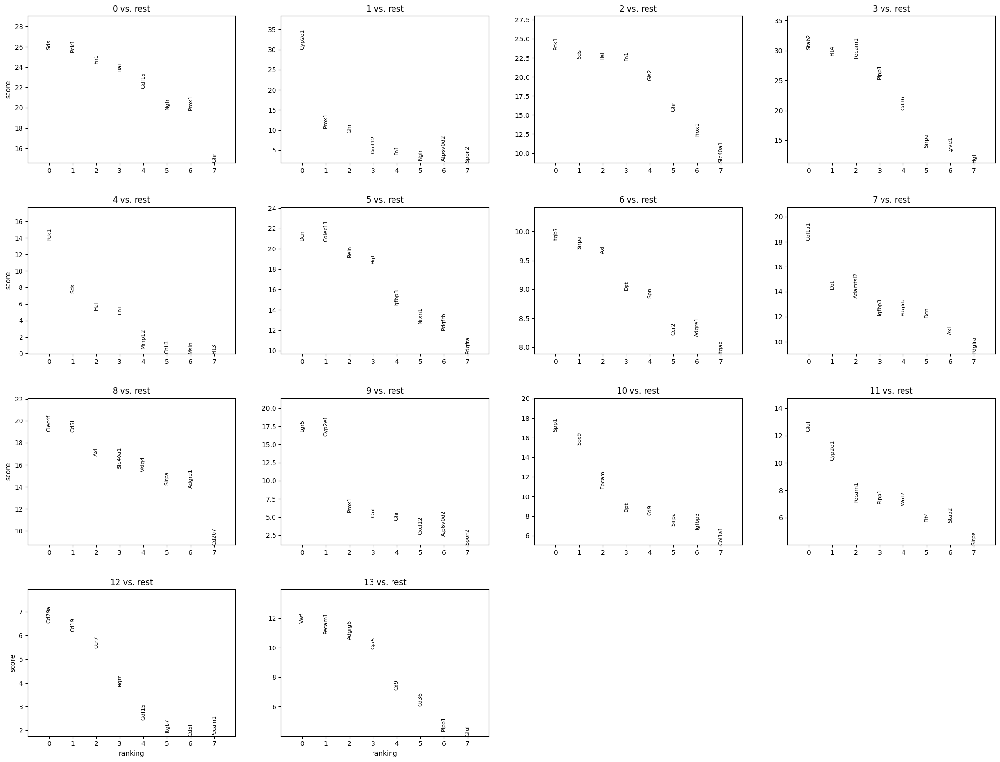

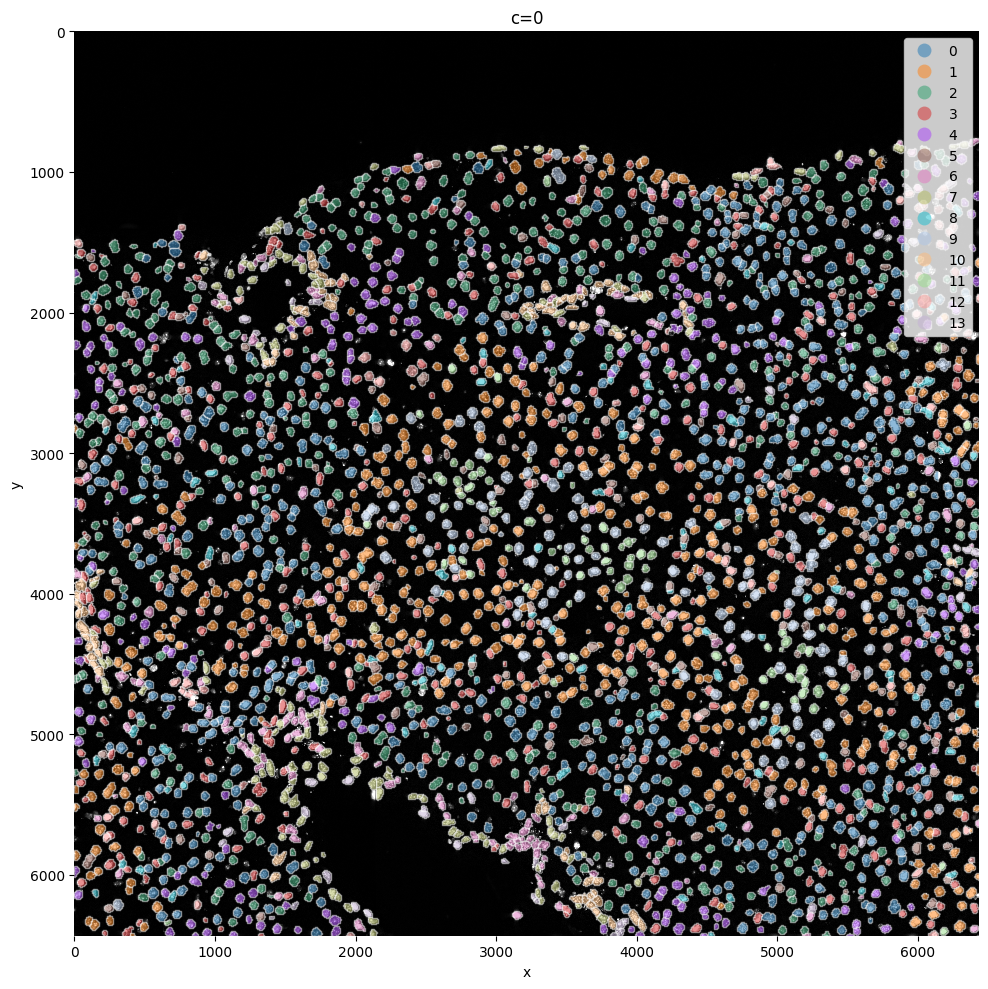

In [27]:
# 1. Run Leiden graph-based partitioning and compute 2D UMAP projections
sdata = sp.tb.leiden(
    sdata,
    labels_layer="segmentation_mask",
    table_layer="table_transcriptomics_filter",
    output_layer="table_transcriptomics_clustered",
    calculate_umap=True,
    calculate_neighbors=True,
    n_pcs=17,
    n_neighbors=35,
    resolution=0.8,
    rank_genes=True,
    key_added="leiden",
    overwrite=True,
)

# 2. Render UMAP coordinates colored by Leiden partition ID beside the ranked gene markers
sp.pl.cluster(
    sdata,
    table_layer="table_transcriptomics_clustered",
    key_added="leiden",
)

# 3. Project Leiden clusters back to physical tissue space coordinates
sp.pl.plot_shapes(
    sdata,
    img_layer="clahe",
    table_layer="table_transcriptomics_clustered",
    column="leiden",
    shapes_layer="segmentation_mask_boundaries",
)

The `sp.pl.plot_shapes` diagnostic map lets us project the unsupervised cell clustering results back onto physical histology coordinates, highlighting cell-type zoning.

## 6. Iterative Cell-Type Annotation

After clustering, we assign biological cell-type identities to the segmented cells. SPArrOW implements a robust **Iterative Enrichment Score Annotation Algorithm** that leverages curated marker gene panels.

### The Scoring & Annotation Logic
* **Enrichment Scoring:** Rather than treating cell classification as a hard cluster-level division, SPArrOW scores each individual cell by comparing its expression of marker genes against a cell-type-balanced reference average.
* **Iterative Adjustments:** The algorithm adjusts the gene-wise averages across the cell types after each iteration.
* **Curated Panels (CSV file):** We provide a marker matrix with genes as rows and target cell types as columns.
  * **Cell-Type Specific weights:** You can pass continuous weighting coefficients representing specificity (e.g., log-fold-change from an atlas) or binary $\{0, 1\}$ values denoting presence/absence.
* **"Unknown" Category:** Any cells where enrichment scores fall below $0.0$ for all represented cell types are flagged as `unknown`.

Let's load the cortical marker gene database and assign biological annotations.

,portal_vein_EC45,LSEC45,LSEC_Portal,LSEC_Central,central_vein_EC45,stellateAll,stellate_PeriPortal,stellate_PeriCentral,FibroblastAll,fibroblastPortal,...,ILC1s,T_cells,pDCs,B_cells,cDC1s,Kupffer_cells,Capsule_and_Central_Vein_Mac,Portal_LAM_macrophages,Monocytes,LECs
Column1,,,,,,,,,,,,,,,,,,,,,
Acta2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Adamtsl2,0,0,0,0,0,1,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
Adgre1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,1,1,0
Adgrg6,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Atp6v0d2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


2025-12-17 12:14:42,195 - sparrow.table._annotation - INFO - Scaling based on number of markers per celltype.
2025-12-17 12:14:42,312 - sparrow.table._annotation - INFO - annotation
HepatocytesPortal               30.512740
HepatocytesCentral              12.645486
LECs                            10.852469
LSEC_Central                    10.632274
Kupffer_cells                    4.057880
stellate_PeriPortal              3.837685
unknown_celltype                 3.114187
Cholangiocytes                   3.082730
Neutrophils                      3.019818
portal_vein_EC45                 2.264863
FibroblastsCentral               1.950299
T_cells                          1.509909
stellate_PeriCentral             1.321170
VSMC                             1.289714
B_cells                          1.163888
cDC1s                            1.038062
ILC1s                            1.006606
Mesothelial_cells                0.912237
LSEC45                           0.817867
Monocytes           

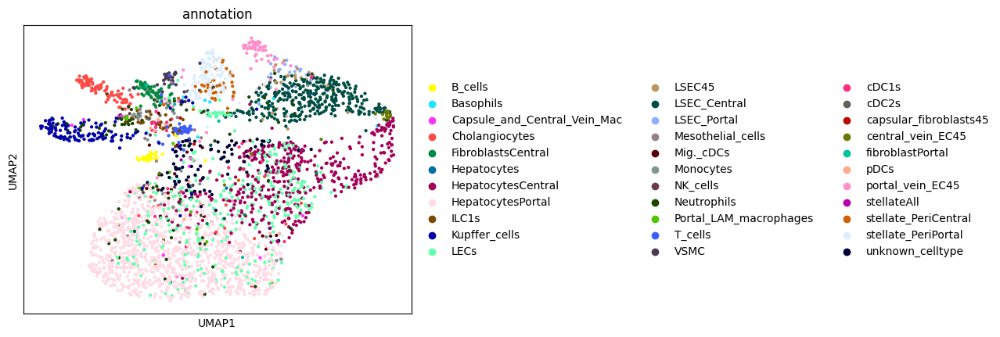

2025-12-17 12:14:42,649 - sparrow.table._annotation - INFO - Iteration 0.
2025-12-17 12:14:42,774 - sparrow.table._annotation - INFO - Scaling based on number of markers per celltype.
2025-12-17 12:14:42,901 - sparrow.table._annotation - INFO - Percentage of cells with changed annotation: 14.66


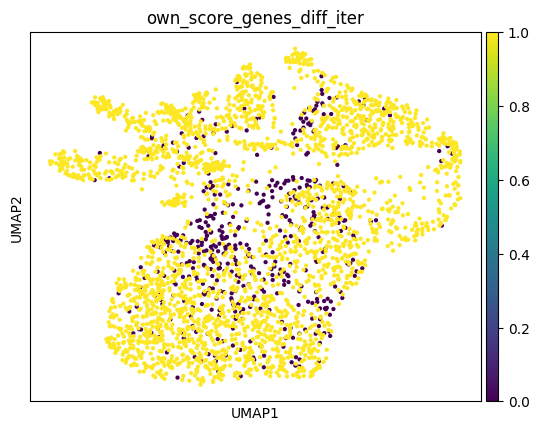

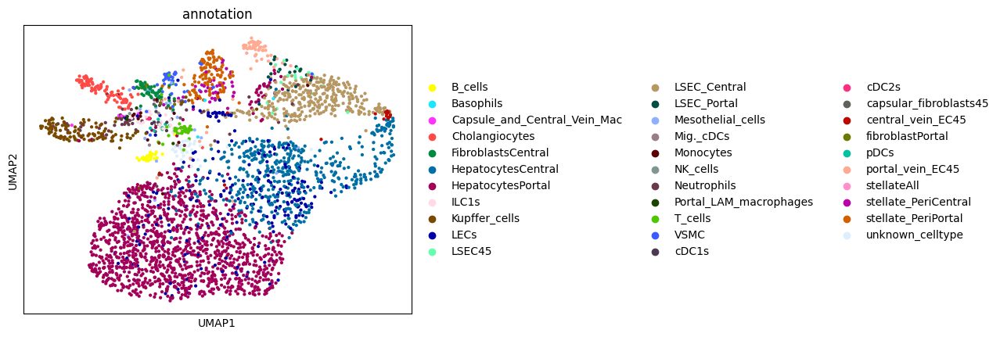

2025-12-17 12:14:43,285 - sparrow.table._annotation - INFO - annotation
HepatocytesPortal               39.383454
HepatocytesCentral              15.256370
LSEC_Central                    10.254797
LECs                             7.675370
Kupffer_cells                    3.837685
stellate_PeriPortal              3.523120
Cholangiocytes                   2.893992
portal_vein_EC45                 2.044668
Neutrophils                      1.793017
FibroblastsCentral               1.698647
T_cells                          1.446996
VSMC                             1.321170
stellate_PeriCentral             1.195344
B_cells                          1.100975
unknown_celltype                 1.006606
ILC1s                            0.849324
Mesothelial_cells                0.754954
LSEC_Portal                      0.660585
LSEC45                           0.566216
central_vein_EC45                0.566216
Monocytes                        0.440390
cDC1s                            0.346021
fibr

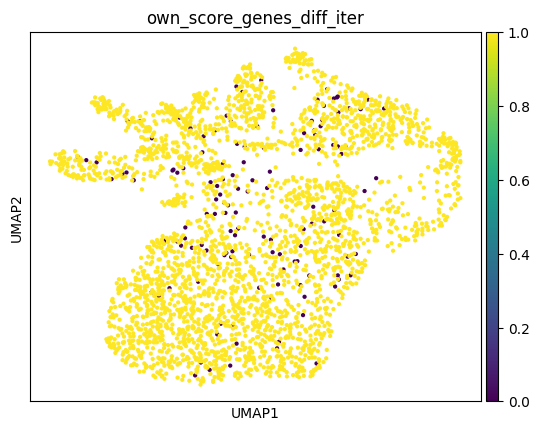

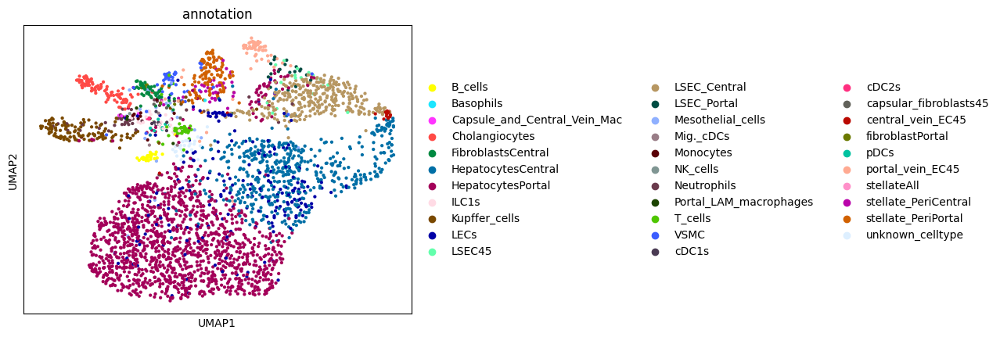

2025-12-17 12:14:43,944 - sparrow.table._annotation - INFO - annotation
HepatocytesPortal               41.679774
HepatocytesCentral              15.791129
LSEC_Central                     9.751494
LECs                             6.605851
Kupffer_cells                    3.806228
stellate_PeriPortal              3.491664
Cholangiocytes                   2.925448
portal_vein_EC45                 1.981755
FibroblastsCentral               1.667191
T_cells                          1.415539
Neutrophils                      1.384083
VSMC                             1.384083
stellate_PeriCentral             1.132432
B_cells                          1.100975
unknown_celltype                 0.817867
ILC1s                            0.817867
Mesothelial_cells                0.723498
LSEC_Portal                      0.629129
LSEC45                           0.534759
central_vein_EC45                0.503303
Monocytes                        0.314564
cDC1s                            0.283108
fibr

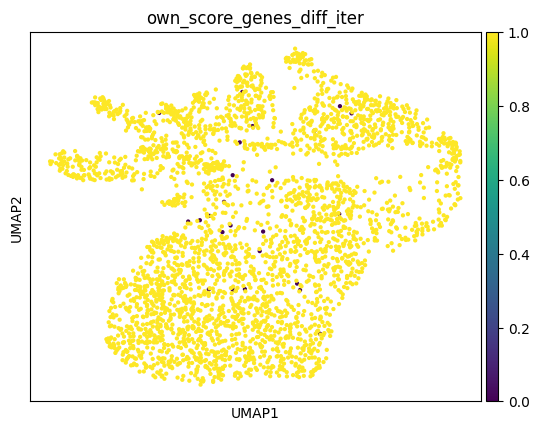

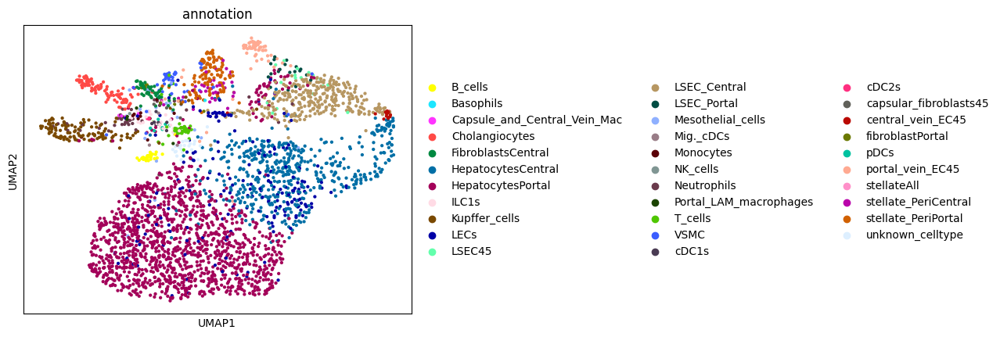

2025-12-17 12:14:44,611 - sparrow.table._annotation - INFO - annotation
HepatocytesPortal               42.151620
HepatocytesCentral              15.916955
LSEC_Central                     9.657125
LECs                             6.259830
Kupffer_cells                    3.806228
stellate_PeriPortal              3.460208
Cholangiocytes                   2.956905
portal_vein_EC45                 1.981755
FibroblastsCentral               1.635735
T_cells                          1.415539
VSMC                             1.384083
Neutrophils                      1.352627
stellate_PeriCentral             1.132432
B_cells                          1.100975
ILC1s                            0.817867
unknown_celltype                 0.723498
Mesothelial_cells                0.723498
LSEC_Portal                      0.629129
LSEC45                           0.534759
central_vein_EC45                0.471846
Monocytes                        0.314564
cDC1s                            0.283108
fibr

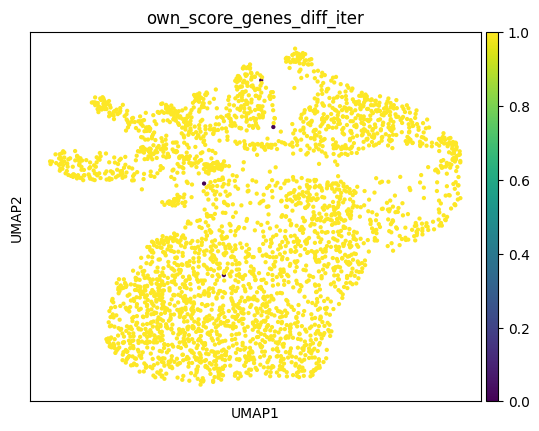

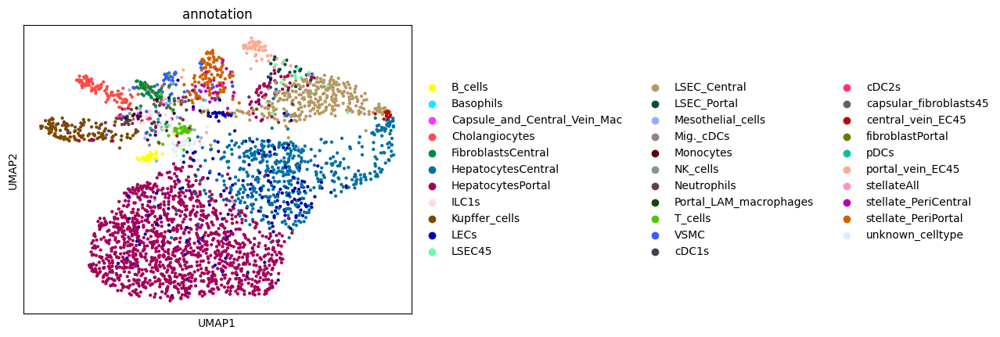

2025-12-17 12:14:45,262 - sparrow.table._annotation - INFO - annotation
HepatocytesPortal               42.183076
HepatocytesCentral              15.885499
LSEC_Central                     9.657125
LECs                             6.259830
Kupffer_cells                    3.806228
stellate_PeriPortal              3.460208
Cholangiocytes                   2.956905
portal_vein_EC45                 1.950299
FibroblastsCentral               1.635735
T_cells                          1.415539
VSMC                             1.384083
Neutrophils                      1.352627
stellate_PeriCentral             1.163888
B_cells                          1.100975
ILC1s                            0.817867
unknown_celltype                 0.754954
Mesothelial_cells                0.723498
LSEC_Portal                      0.629129
LSEC45                           0.534759
central_vein_EC45                0.471846
Monocytes                        0.314564
cDC1s                            0.283108
fibr

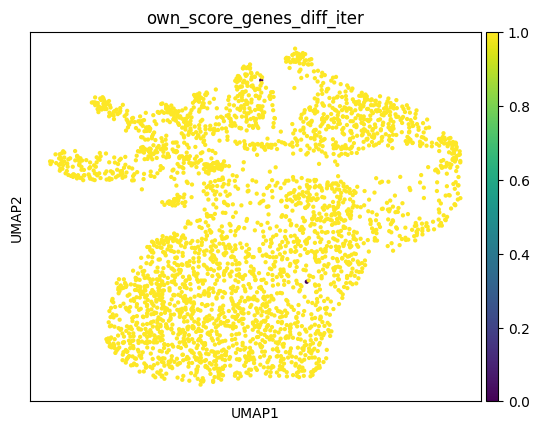

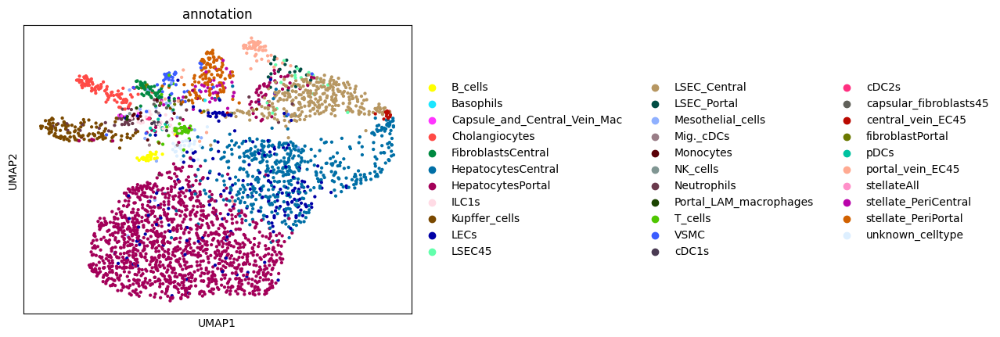

2025-12-17 12:14:45,910 - sparrow.table._annotation - INFO - annotation
HepatocytesPortal               42.214533
HepatocytesCentral              15.854042
LSEC_Central                     9.657125
LECs                             6.259830
Kupffer_cells                    3.806228
stellate_PeriPortal              3.491664
Cholangiocytes                   2.956905
portal_vein_EC45                 1.950299
FibroblastsCentral               1.635735
T_cells                          1.415539
VSMC                             1.384083
Neutrophils                      1.352627
stellate_PeriCentral             1.132432
B_cells                          1.100975
ILC1s                            0.817867
unknown_celltype                 0.754954
Mesothelial_cells                0.723498
LSEC_Portal                      0.629129
LSEC45                           0.534759
central_vein_EC45                0.471846
Monocytes                        0.314564
cDC1s                            0.283108
fibr

In [ ]:


# Load the marker list from the registry
path_mg = registry.fetch("transcriptomics/resolve/mouse/markerGeneListMartinNoLow.csv")
df = pd.read_csv(path_mg, index_col=0, delimiter=",")

# Standardize cell type string names for SpatialData compatibility
df.columns = df.columns.str.replace(" ", "_", regex=False)

# Preview our marker matrix structure
display(df.head())

# Run the iterative marker scoring algorithm
sdata, celltypes_scored, celltypes_all = sp.tb.score_genes_iter(
    sdata,
    labels_layer="segmentation_mask",
    table_layer="table_transcriptomics_clustered",
    output_layer="table_transcriptomics_score_genes_iter",
    path_marker_genes=df,
    overwrite=True,
)

In [29]:
sdata.tables["table_transcriptomics_score_genes_iter"]

AnnData object with n_obs × n_vars = 3179 × 98
    obs: 'cell_ID', 'fov_labels', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_2_genes', 'pct_counts_in_top_5_genes', 'n_counts', 'shapeSize', 'leiden', 'Cleanliness', 'annotation', 'portal_vein_EC45', 'LSEC45', 'LSEC_Portal', 'LSEC_Central', 'central_vein_EC45', 'stellateAll', 'stellate_PeriPortal', 'stellate_PeriCentral', 'FibroblastAll', 'fibroblastPortal', 'FibroblastsCentral', 'VSMC', 'capsular_fibroblasts45', 'Mesothelial_cells', 'Hepatocytes', 'HepatocytesPortal', 'HepatocytesCentral', 'Cholangiocytes', 'cDC2s', 'Mig._cDCs', 'Neutrophils', 'Basophils', 'NK_cells', 'ILC1s', 'T_cells', 'pDCs', 'B_cells', 'cDC1s', 'Kupffer_cells', 'Capsule_and_Central_Vein_Mac', 'Portal_LAM_macrophages', 'Monocytes', 'LECs'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'mean', 'std'
    uns: 'leiden',

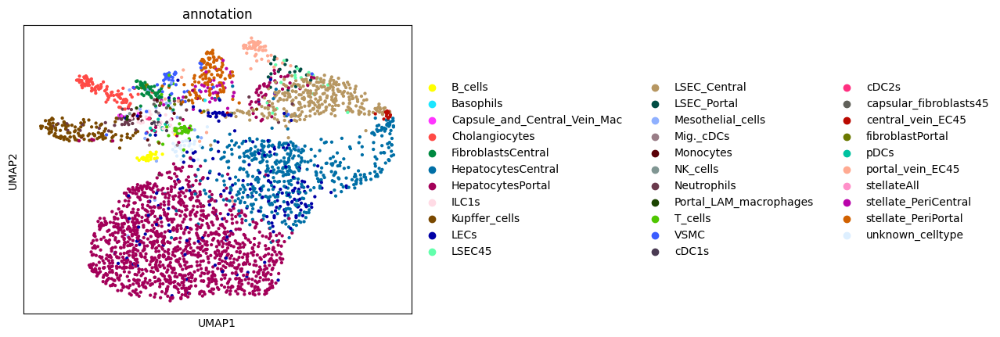

In [ ]:
# Plot UMAP coordinates colored by annotated cell type identities
sc.pl.umap(
    sdata.tables["table_transcriptomics_score_genes_iter"], 
    color=_ANNOTATION_KEY
)

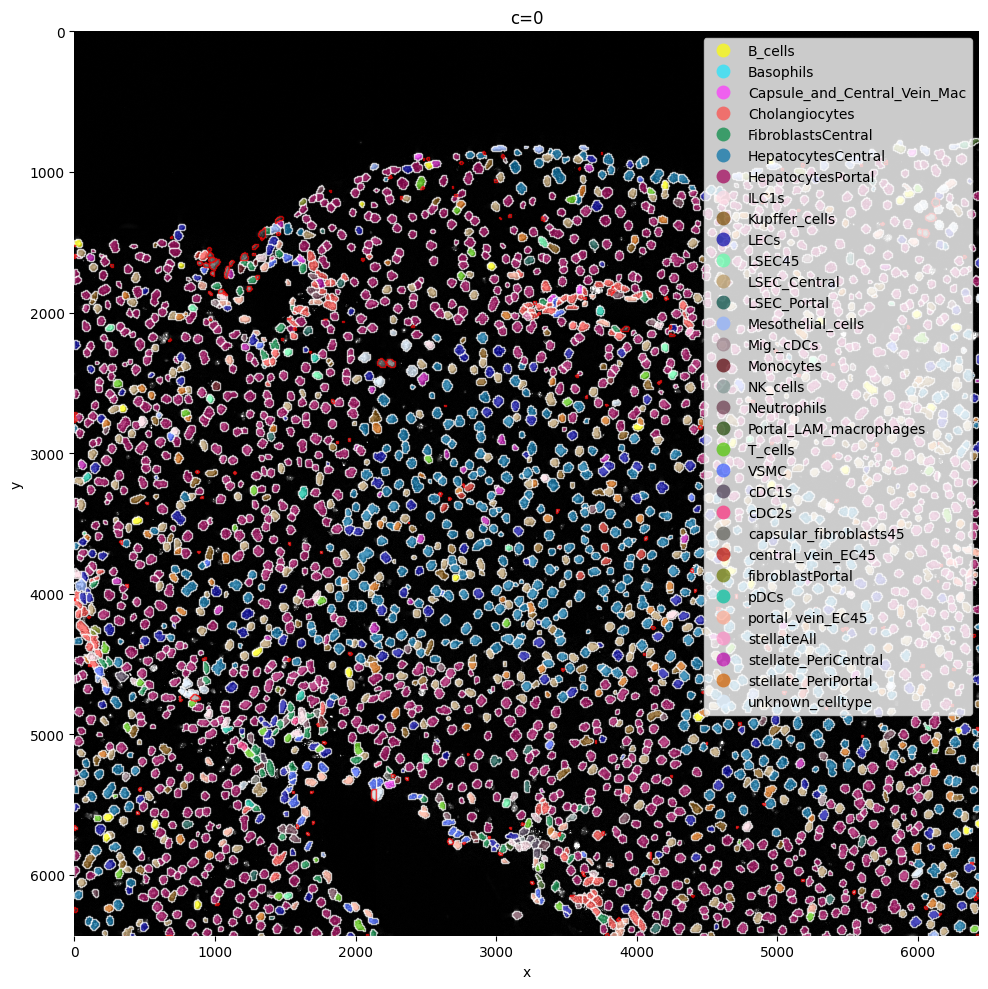

In [31]:
# Combine all filtered fallback shape layers to display on the background
filtered_layers = [
    "filtered_segmentation_segmentation_mask_boundaries",
    "filtered_low_counts_segmentation_mask_boundaries",
    "filtered_size_segmentation_mask_boundaries",
]

# Plot cell type assignments in physical space, highlighting filtered objects
sp.pl.plot_shapes(
    sdata,
    column=_ANNOTATION_KEY,
    img_layer="clahe",
    table_layer="table_transcriptomics_score_genes_iter",
    shapes_layer="segmentation_mask_boundaries",
    alpha=0.7,
    shapes_layer_filtered=filtered_layers,
)

## 7. Neighborhood Enrichment Analysis

Spatial transcriptomics allows us to go beyond single-cell profiling and address tissues as structured, communicating networks of cell types.

### Native Neighborhood Enrichment logic
By using SPArrOW's **Neighborhood Enrichment** function which uses [Squidpy](https://www.nature.com/articles/s41592-021-01358-2) functionalities under the hood, we will:
* Construct an adjacency graph of cell-to-cell spatial coordinates.
* Assess the cell-type grouping frequencies to identify which cells are statistically clustered together or avoided.

In [32]:
# Calculate spatial relative neighborhood enrichment scores across annotated cell types
sdata = sp.tb.nhood_enrichment(
    sdata,
    labels_layer="segmentation_mask",
    table_layer="table_transcriptomics_score_genes_iter",
    output_layer="table_transcriptomics_score_genes_enrichemnt",
    overwrite=True,
)

  0%|          | 0/1000 [00:00<?, ?/s]

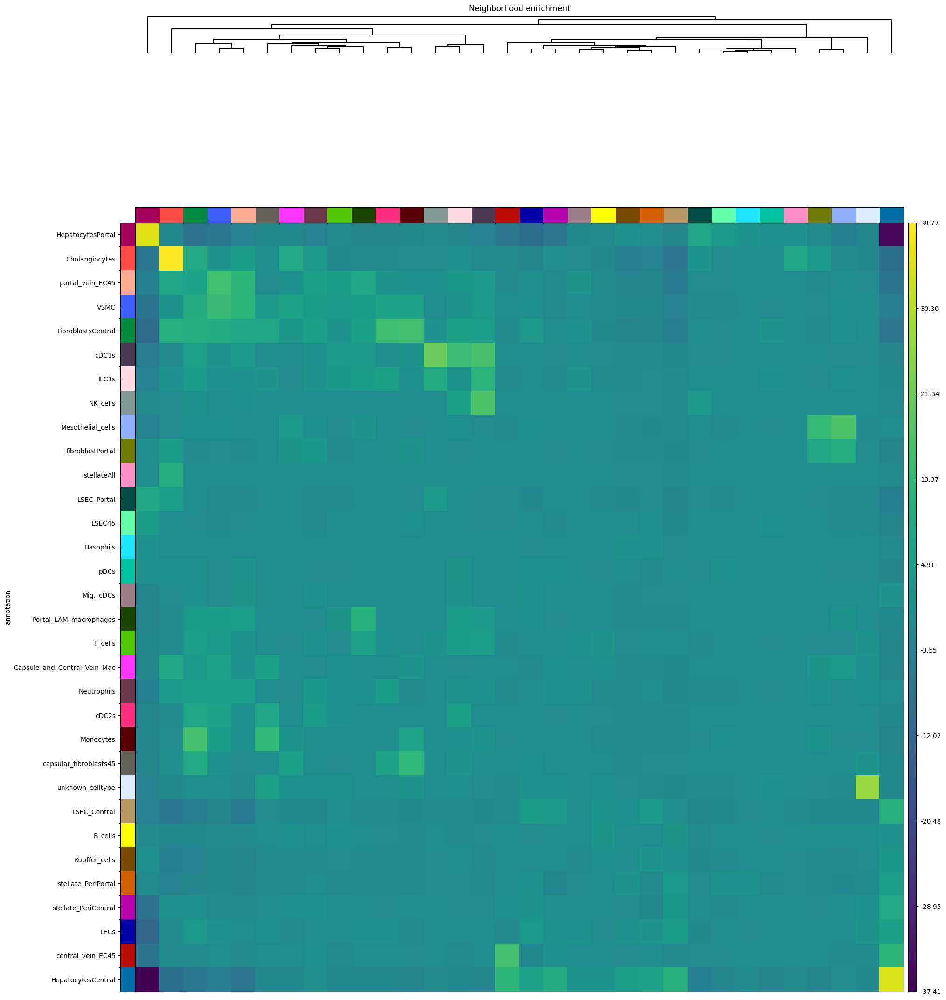

In [33]:
# Plot neighborhood enrichment adjacency matrix heatmaps
sp.pl.nhood_enrichment(
    sdata, 
    table_layer="table_transcriptomics_score_genes_enrichemnt", 
    celltype_column=_ANNOTATION_KEY
)

## Next Steps

**Congratulations! You have completed the full SPArrOW spatial transcriptomics pipeline.**

You have successfully:
* Ingested raw image tiles and transcript coordinate lists into cohesive, standardized `SpatialData` constructs.
* Corrected complex platform optical artifacts (illumination vignette and stitching gridlines).
* Parsed millions of coordinate records and mapped transcripts directly to single cells.
* Managed cell quality, filtered on cell sizes, clustered communities, and iteratively derived cell identities.

### Where to go from here?
* Explore more platform-specific data loading tutorials, such as the [Visium HD Tutorial](visiumhd_tutorial.ipynb).
* Head over to the [Official SPArrOW Documentation](https://sparrow-pipeline.readthedocs.io) to browse the API references and advanced tutorials.